**Κατεβάστε το αρχείο δεδομένων Data_ex1.txt που περιέχει δεδομένα δύο
χαρακτηριστικών x = [x1, x2] από 3 κλάσεις (ω1, ω2, ω3). Κάθε γραμμή του αρχείου περιέχει δεδομένα στη μορφή: x1, x2, class_label.**

Προκειμένου να μην χρειάζεται κάθε φορά να φορτώνω χειροκίνητα το αρχείο που περιέχει τα δεδομένα, συνδέω το google colab με τον λογαριασμό μου στο google drive μέσω της βιβλιοθήκης google.colab. Με την εντολή mount φορτώνονται τα περιεχόμενα του Drive μου. Έπειτα, προσδιορίζω την διεύθυνση του αρχείου Data_ex1.txt, το οποίο και διαβάζω με την βιβλιοθήκη numpy, ώστε να το αντιμετωπίζω σαν πίνακα, ο οποίος περιέχει δεδομένα τύπου float.

Εάν δεν θέλω να συνδεθώ στο Drive, αλλά να φορτώσω χειροκίνητα το αρχείο Data_ex1.txt, χρησιμοποιώ την τελευταία εντολή του κελιού.

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

# Πρέπει να αλλάξει ανάλογα με την θέση του αρχείου Data_ex1 στο Google Drive
# Διαφορετικά να βγει από σχόλιο η τελευταία γραμμή του κελιού
path_to_Data_ex1 = '/content/gdrive/MyDrive/Colab Notebooks/Pattern Recognition/HW 02/Data_ex1.txt'

import numpy as np
global file
file = np.loadtxt(path_to_Data_ex1, dtype=float, encoding=None, delimiter=",")
del path_to_Data_ex1

# Εάν θέλουμε να ανεβάσουμε χειροκίνητα το αρχείο Data_ex1.txt
# file = np.loadtxt('Data_ex1.txt', dtype=float, encoding=None, delimiter=",")

Mounted at /content/gdrive


Αρχικά, διαχωρίζω τα δεδομένα σε ξεχωριστούς πίνακες ανάλογα με την κλάση στην οποία ανήκουν, δηλαδή ανάλογα με την τιμή της τρίτης στήλης του πίνακα. Οι ξεχωριστοί πίνακες έχουν δύο στήλες, καθώς έχουμε δύο χαρακτηριστικά x1 και x2, και τόσες γραμμές όσο το πλήθος των στοιχείων που ανήκουν στην αντίστοιχη κλάση. Για την συγκεκριμένη άσκηση, όλες οι κλάσεις αποτελούνται από 100 στοιχεία.

In [2]:
# Διαχωρισμός των δεδομένων σε κλάσεις
classw1 = file[file[:, 2] == 1, :2]
classw2 = file[file[:, 2] == 2, :2]
classw3 = file[file[:, 2] == 3, :2]

# **ΕΡΩΤΗΜΑ Α**

**Να γράψετε κατάλληλο κώδικα ώστε να εκτιμήσετε τις πυκνότητες πιθανότητας
για τις τρεις κλάσεις με τη μέθοδο παραθύρων Parzen, για
συνάρτηση παραθύρου:**

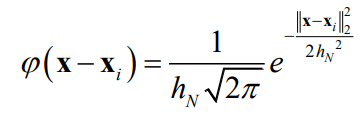

**και για h = 0.3 να απεικονίσετε κατάλληλα τις κατανομές σε κοινό γράφημα.**


Στόχος του ερωτήματος είναι να προσδιορίσω την κατανομή των στοιχείων κάθε κλάσης με μη παραμετρικές τεχνικές. Η προσέγγιση μιας άγνωστης συνάρτησης πυκνότητας πιθανότητας (σ.π.π.) γίνεται αξιοποιώντας το ιστόγραμμα. Για την μονοδιάσταση περίπτωση, ο άξονας των στοιχείων (x) διαιρείται σε διαδοχικές περιοχές μήκους h. Για κάθε περιοχή εκτιμάται η πιθανότητα ένα στοιχείο x να βρίσκεται σε αυτήν.

Συνοπτικά, για κάθε σημείο του test set και με κέντρο αυτό τοποθετείται ένα παράθυρο καθορισμένου πλάτους h. Υπολογίζεται το άθροισμα των δεδομένων εκπαίδευσης που βρίσκονται εντός του παραθύρου και το σημείο του test set ταξινομείται στην κλάση με το μεγαλύτερο άθροισμα. Ο όγκος παραμένει σταθερός ενώ το πλήθος των σημείων k ποικίλει. Οι παράμετροι που καθορίζονται από τον χρήστη είναι το μήκος του παραθύρου h και φυσικά το σύνολο των στοιχείων εκπαίδευσης.

Σημειώνω σε αυτό το σημείο ότι για την συνάρτηση φ() που δίνεται στην εκφώνηση όρος του κλάσματος αντιμετωπίζεται ως τύπος του όγκου του παραθύρου.

BHMA 1: Προσδιορισμός συνάρτησης παραθύρου

In [26]:
# Ορισμός συνάρτησης Parzen window     φ(x-xi) = exp(-abs(x-xi)^2/(2*h^2))
def parzen_window(x, data, h):
    N, d = data.shape

    sum_kernels = np.sum(np.exp(-np.sum((x - data) ** 2, axis=1) / (2 * h ** 2)))

    # Υπολογισμός σ.π.π.
    volume = (1 / (h * np.sqrt(2 * np.pi))) ** d    # 1 / (h * sqrt(2π)))
    f = sum_kernels * volume / N
    return f

ΒΗΜΑ 2: Προσδιορισμός ορίων δεδομένων εκτύπωσης - Καθορισμός συνόλου εξέτασης test set

Το σύνολο εξέτασης καθορίζεται από τις ακραίες τιμές των δεδομένων εκπαίδευσης (training set, αρχικά δεδομένα του αρχείου) και μία ανοχή. Η τιμή της ανοχής, εδώ +-3, καθορίστηκε αθαίρετα.

In [4]:
def plot_range():
    # Δημιουργία διαστήματος τιμών για την απεικόνιση των πυκνοτήτων
    x_min, x_max = file[:, 0].min() - 3, file[:, 0].max() + 3   # όρια για x1
    y_min, y_max = file[:, 1].min() - 3, file[:, 1].max() + 3   # όρια για x2

    # Με κριτήριο τα όρια των χαρακτηριστικών δημιουργούνται ομοιόμορφα διανύσματα χαρακτηριστικών 100 σημείων
    X, Y = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    array1 = np.zeros(X.shape)  # Μετατροπή των τιμών πυκνότητας πίσω σε πλέγμα για να τα αποτυπώσουμε
    array2 = np.zeros(X.shape)
    array3 = np.zeros(X.shape)
    return X, Y, array1, array2, array3

ΒΗΜΑ 3: Ταξινόμηση δεδομένων test set

In [5]:
def parzen_classifier(h, classw1, classw2, classw3, appearance, tolerance):

    X, Y, Z1, Z2, Z3 = plot_range()

    # Υπολογισμός της πυκνότητας πιθανότητας για κάθε κλάσης και κάθε σημείου στο διάστημα
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            point = np.array([X[i, j], Y[i, j]])
            Z1[i, j] = parzen_window(point, classw1, h)
            Z2[i, j] = parzen_window(point, classw2, h)
            Z3[i, j] = parzen_window(point, classw3, h)

    if appearance:
      title = 'Μέθοδος παραθύρων Parzen με h = ' + str(h)
      show_diagrams(Z1, Z2, Z3, title, X, Y, tolerance)
      print()
      show_diagrams_interactive(Z1, Z2, Z3, title, X, Y)
    else:
      return X, Y, Z1, Z2, Z3

BHMA 4: Απεικόνιση κατανομών σε τριδιάστατο διάστημα

Αναφορικά με την απεικόνιση των κατανομών, αυτή γίνεται τόσο σε στατικό όσο και διαδραστικό διάγραμμα. Εφόσον διαθέτουμε δύο χαρακτηριστικά, σαφώς χρειαζόμαστε τριδιάστατη απεικόνιση.



*Μη διαδραστικό διάγραμμα:*

Κάθε κατανομή απεικονίζεται ως μία επιφάνεια. Οι επιφάνειες τοποθετούνται διαδοχικά η μία επάνω στην άλλη με την σειρά που δηλώθηκαν. Απόρροια αυτού είναι να γίνονται αλληλοεπικαλύψεις για τις χαμηλές τιμές της τρέχουσας επιφάνειας με τις μεγαλύτερες τιμές των προηγούμενων. Για να αντιμετωπίσω το πρόβλημα αυτό όρισα ένα threshold για τις τιμές οι οποίες πρόκειται να απεικονιστούν. H τιμή του threshold είναι ξεχωριστή για κάθε κατανομή και καθορίζεται από την μικρότερη τιμή των δεδομένων της προσαυξημένη με μία μικρή τιμή ανοχής, η οποία καθορίζεται αυθαίρετα.

Αποφάσισα να απεικονίσω το διάγραμμα τέσσερις φορές με διαφορετικές γωνίες θέασης προκειμένου να έχω μία πιο αντιπροσωπευτική αντίληψη των κατανομών. Οι τιμές των γωνιών θέασης, επίσης, είναι αυθαίρετες.



In [6]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def show_diagrams(pw1, pw2, pw3, title, X, Y, tolerance):

    # εντολές για να εμφανίσω όλες τις τιμές και να αιτιολογήσω την χρήση της μάσκας.
    # pw1_masked = pw1
    # pw2_masked = pw2
    # pw3_masked = pw3

    # Μάσκα για τις τιμές κάτω από το κατώφλι
    pw1_masked = np.where(pw1 < np.min(pw1)+tolerance, None, pw1)
    pw2_masked = np.where(pw2 < np.min(pw2)+tolerance, None, pw2)
    pw3_masked = np.where(pw3 < np.min(pw3)+tolerance, None, pw3)

    fig = plt.figure(figsize=(14, 10))
    fig.suptitle(title, fontsize=16, y=1)

    for i, view in enumerate([(20, -45), (30, 30), (40, 120), (50, 210)]):
        ax = fig.add_subplot(2, 2, i+1, projection='3d')
        ax.plot_surface(X, Y, pw1_masked, color='r', alpha=0.5)
        ax.plot_surface(X, Y, pw2_masked, color='g', alpha=0.5)
        ax.plot_surface(X, Y, pw3_masked, color='b', alpha=0.5)
        ax.set_xlabel('Χαρακτηριστικό x1')
        ax.set_ylabel('Χαρακτηριστικό x2')
        ax.set_zlabel('PDF')

        elev, azim = view
        ax.set_title(f'View {i+1} (elev={elev}, azim={azim})')
        ax.view_init(elev=view[0], azim=view[1])

    # Μεταβλητές για το υπόμνημα
    proxy_artists = [plt.Line2D([0], [0], linestyle="none", c=color, marker='s') for color in ['r', 'g', 'b']]
    fig.legend(proxy_artists, ['Class 1', 'Class 2', 'Class 3'], loc='lower center', bbox_to_anchor=(0.5, 0.02), ncol=3)

    plt.tight_layout()
    plt.show()

*Διαδραστικό διάγραμμα*

In [7]:
import plotly.graph_objs as go
from plotly.offline import iplot

def show_diagrams_interactive(pw1, pw2, pw3,title, X, Y):

    # Δημιουργία των επιφανειών
    surface1 = go.Surface(z=pw1, x=X, y=Y, colorscale='Reds',   opacity=1, showscale=False)
    surface2 = go.Surface(z=pw2, x=X, y=Y, colorscale='Greens', opacity=1, showscale=False)
    surface3 = go.Surface(z=pw3, x=X, y=Y, colorscale='Blues',  opacity=1, showscale=False)

    data = [surface1, surface2, surface3]

    layout = go.Layout(
            title={'text': title, 'y':0.98, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top' },
            scene=dict(xaxis=dict(title='Χαρακτηριστικό x1'),
                       yaxis=dict(title='Χαρακτηριστικό x2'),
                       zaxis=dict(title='Πυκνότητα Πιθανότητας'),
                      ),
        legend=dict(# x=0.05, y=0.95,
                    traceorder="normal",
                    font=dict(family="sans-serif", size=12, color="black"),
                    bgcolor="LightSteelBlue",
                    bordercolor="Black",
                    borderwidth=2         ),
        autosize=False,
        width=800,         height=800,
        # margin=dict(l=65, r=50, b=65, t=90)
    )

    fig = go.Figure(data=data, layout=layout)
    iplot(fig)

Κλήση συνάρτησης parzen_classifier για διαφορετικές τιμές h.

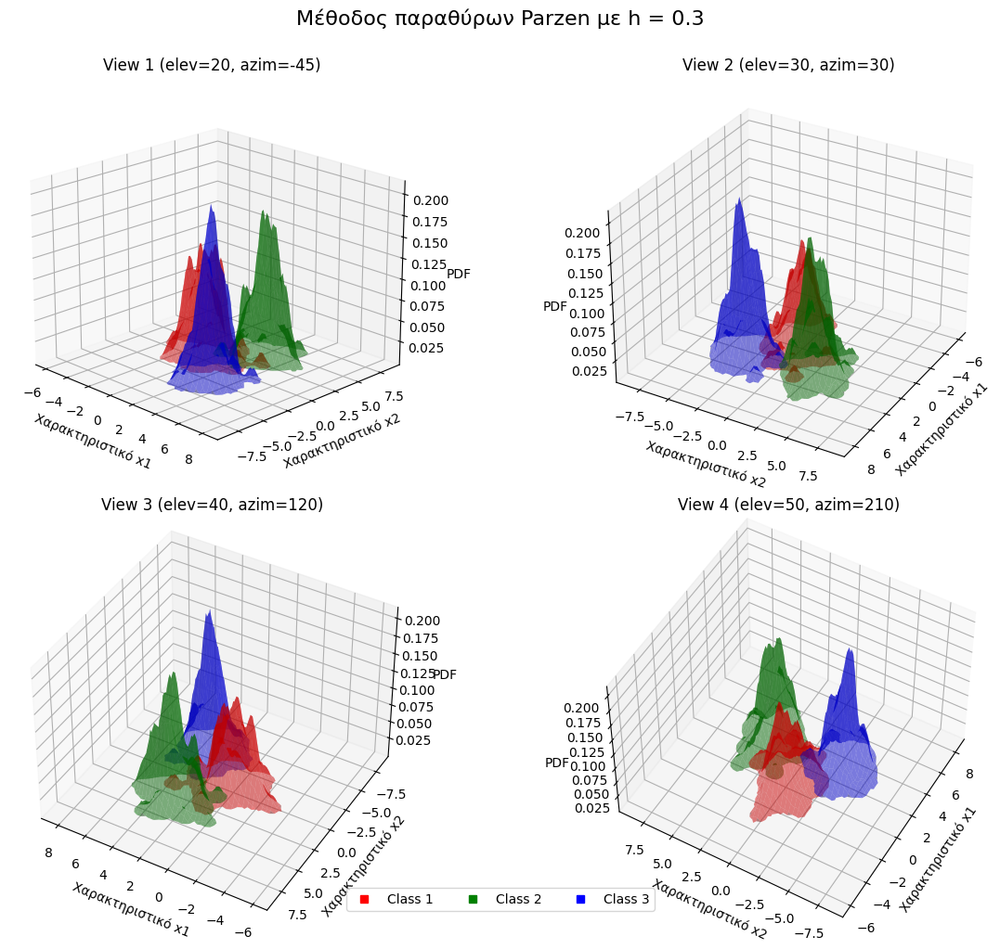

In [8]:
parzen_classifier(0.3, classw1, classw2, classw3, True, 0.001)

**Δοκιμάστε να κάνετε εκτίμηση για h=0.7 και h=0.1. Τι παρατηρείτε?**

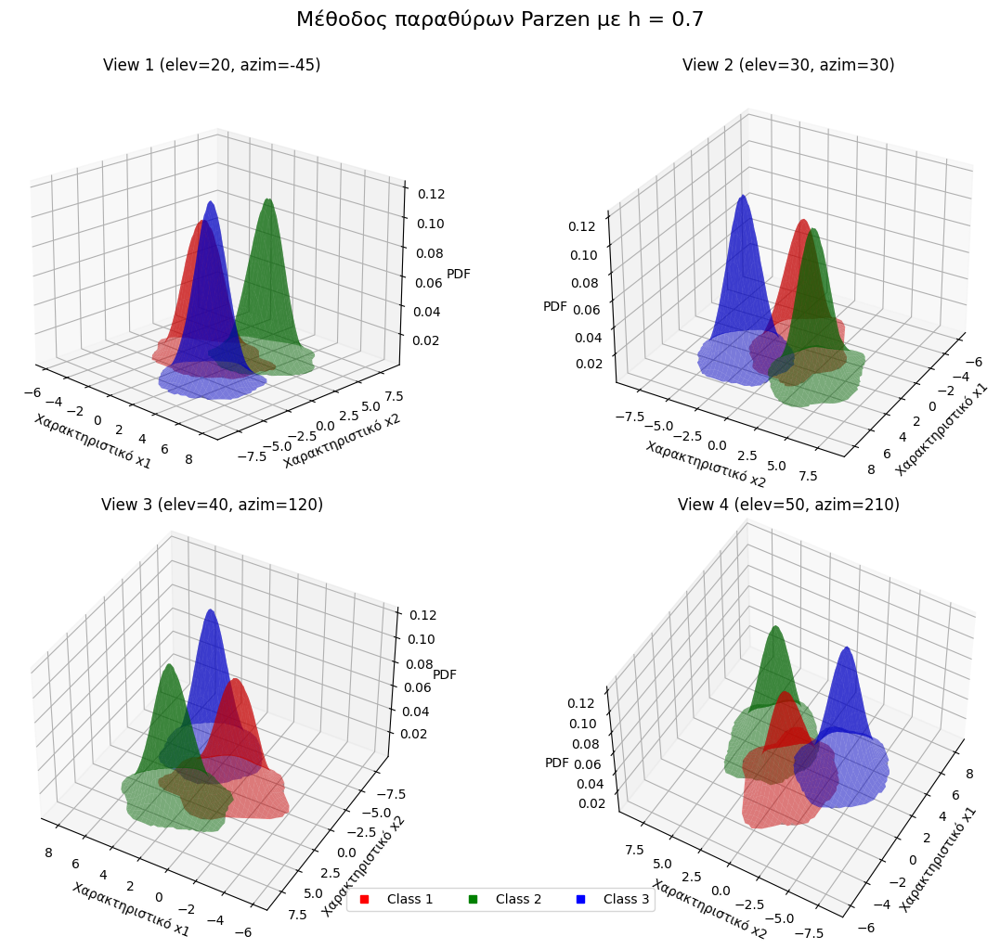

In [9]:
parzen_classifier(0.7, classw1, classw2, classw3, True, 0.001)

Εφόσον αυξάνεται η τιμή του h, το παράθυρο γίνεται πιο φαρδύ, δηλαδή περιλαμβάνονται περισσότερα στοιχεία στον υπολογισμό της σ.π.π. για κάθε σημείο x. Η σ.π.π. προσεγγίζεται από ένα πεπερασμένο πλήθος συναρτήσεων μεγάλης διασποράς με κέντρα τα σημεία του συνόλου εκπαίδευσης. Απόρροια αυτού είναι να έχω πιο ομαλές εκτιμήσεις των πυκνοτήτων χωρίς θόρυβο, όπως φαίνεται και στα παραπάνω διαγράμματα. Ωστόσο, χάνεται η τοπική δομή των δεδομένων.

Στο σημείο αυτό τονίζεται ότι η αύξηση του h μπορεί να οδηγήσει σε υπερβολικά λείες εκτιμήσεις αγνοώντας την δομή των δεδομένων με συνέπεια την υποεκτίμηση των κορυφών των κατανομών (underfitting).


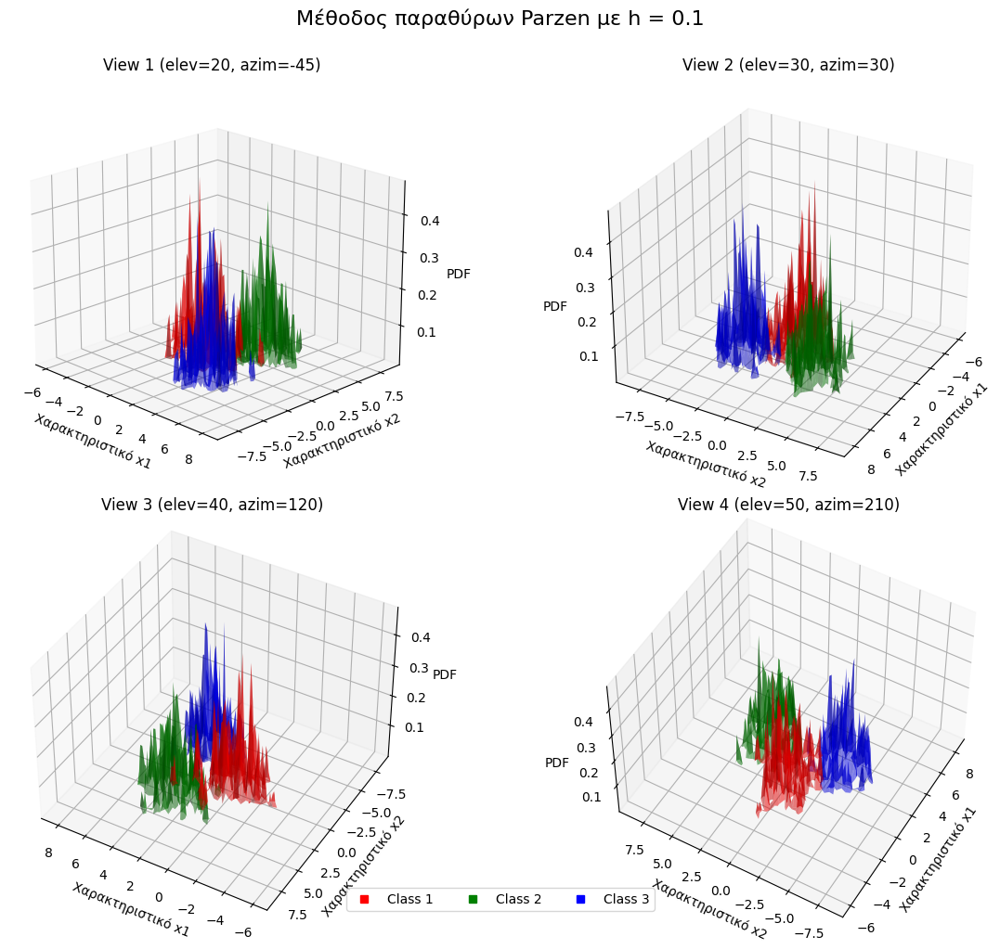

In [10]:
parzen_classifier(0.1, classw1, classw2, classw3, True, 0.001)

Εφόσον μειώνεται η τιμή του h, το παράθυρο γίνεται πιο στενό, δηλαδή περιλαμβάνονται λιγότερα στοιχεία στον υπολογισμό της σ.π.π. για κάθε x. Για πολύ μικρές τιμές μάλιστα, η σ.π.π. προσεγγίζεται από ένα πεπερασμένο πλήθος αιχμηρών συναρτήσεων τύπου δέλτα με κέντρα τα σημεία του συνόλου εκπαίδευσης. Έτσι, καθώς κινούμαστε μέσα στον χώρο, η απόκριση της πιθανότητας είναι πολύ υψηλή κοντά στα στοιχεία του συνόλου εκπαίδευσης. Απόρροια αυτού είναι να έχω πιο ακριβές σχήμα των κατανομών με ανίχνευση λεπτομερειών στα δεδομένα.

Στο σημείο αυτό τονίζεται ότι η μείωση του h μπορεί να οδηγήσει σε υπερβολικά ανώμαλες εκτιμήσεις που προκύπτουν από τον θόρυβο στα δεδομένα (overfitting).


Συνεπώς, η επιλογή κατάλληλης τιμής για το h είναι ζωτικής σημασίας. Παρόλο που έχουν προταθεί αρκετές προσεγγίσεις στη βιβλιογραφία ακόμα ένας απλός τρόπος είναι να ξεκινήσουμε με μια αρχική τιμή την οποία θα τροποποιούμε επαναληπτικά προκειμένου να ελαχιστοποιήσουμε το προκύπτον σφάλμα ταξινόμησης. Το σφάλμα εκτιμάται μέσω κατάλληλου χειρισμού του συνόλου εκπαίδευσης.

**Εάν είχατε στη διάθεσή σας μόνο το 25% των δεδομένων, τι τιμή θα έπρεπε να έχει το hN για να κάνετε εκτίμηση με παρόμοια λεπτομέρεια με την αρχική? Επιβεβαιώστε την απάντησή σας πειραματικά.**

Εφόσον έχω στην διάθεσή μου μονάχα το 25%, θα πρέπει να αφαιρέσω το υπόλοιπο 75%. Προκειμένου να διατηρήσω την ίδια αναλογία των δεδομένων κάθε κλάσης, δηλαδή κάθε κλάση να συνεχίσει να αντιπροσωπεύει το ίδιο κομμάτι του συνόλου δεδομένων. Με αυτόν τον τρόπο, αποφεύγεται επιπλέον και η υπερπροσαρμογή (overfitting) σε μία συγκεκριμένη κλάση η οποία θα περιέχει περισσότερα στοιχεία έναντι των υπολοίπων κλάσεων. Τα δεδομένα που τελικά παραμένουν προσδιορίζονται από την γραμμή στην οποία βρίσκονται. Η τιμή της γραμμής παράγεται με τυχαίο τρόπο.

Για τα δεδομένα του αρχείου Data_ex01.txt, κάθε κλάση θα αποτελείται από 25 στοιχεία, έναντι 100 στην αρχή.


In [11]:
# Διατηρώ τυχαία το 25% των δεδομένων από κάθε κλάση με ομοιόμορφο τρόπο
def keep_25_percent(class_data):
    num_samples_to_select = int(len(class_data) * 0.25)
    indices_to_keep = np.random.choice(len(class_data), num_samples_to_select, replace=False)
    return class_data[indices_to_keep]

classw1_25 = keep_25_percent(classw1)
classw2_25 = keep_25_percent(classw2)
classw3_25 = keep_25_percent(classw3)

Εφόσον μειώνεται το πλήθος των δειγμάτων (N), η επιρροή κάθε δεδομένου στην εκτιμώμενη κατανομή αυξάνεται, επειδή υπάρχουν λιγότερα σημεία δεδομένων για να "γεμίσουν" τον ίδιο χώρο. Αυτό σημαίνει ότι το h θα πρέπει να αυξηθεί για να διατηρηθεί η ίδια επίδραση στην εκτιμώμενη κατανομή. Για μία πρώτη εκτίμηση της νέας τιμής του h επιλέγω να χρησιμοποιήσω τον γενικευμένο κανόνα του Silverman (rule of thumb). Περισσότερες πληροφορίες αναφορικά με τον κανονόνα βρίσκονται στο report που συνοδεύει τον κώδικα.

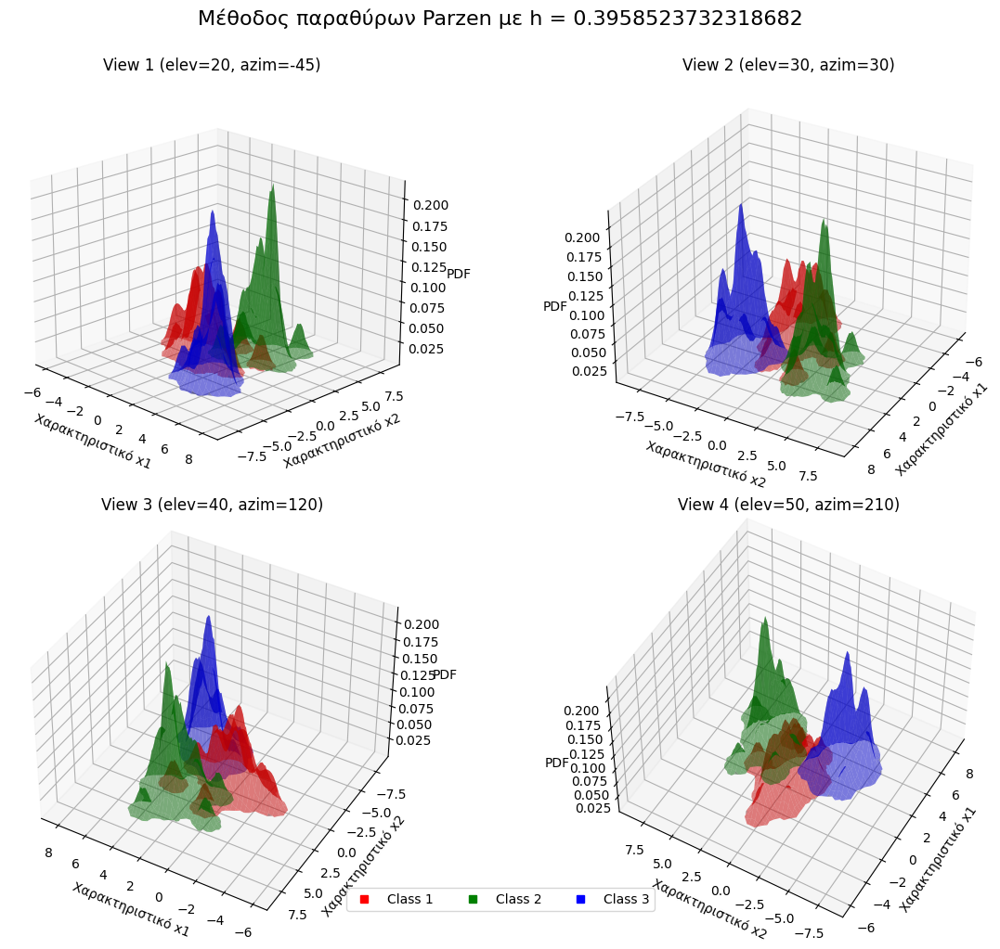

In [12]:
h = 0.3*4**0.2
parzen_classifier(h, classw1_25, classw2_25, classw3_25, True, 0.001)
del classw1_25, classw2_25, classw3_25, h

# **ΕΡΩΤΗΜΑ Β**

**Να γράψετε κατάλληλο κώδικα ώστε να εκτιμήσετε τις πυκνότητες πιθανότητας για τις τρεις κλάσεις με την μέθοδο ΚΝΝ.**



Μία άλλη εκδοχή του προσδιορισμού των κατανομών με μη παραμετρικές τεχνικές είναι να διατηρήσω σταθερό το πλήθος k των στοιχείων εκπαίδευσης που καθορίζουν την ταξινόμηση και να μεταβάλλω τον όγκο. Η μέθοδος αυτή είναι γνωστή ως kNN (k Nearest Neighbors).

Για κάθε σημείο του test set υπολογίζεται η απόσταση του από όλα τα σημεία στοιχεία του συνόλου εκπαίδευσης. Επομένως, για μεγάλα datasets ενδέχεται να απαιτείται μεγάλη υπολογιστική ισχύς. Η απόσταση αυτή συνήθως είναι η Ευκλείδεια, οπότε πλέον δεν έχω υπερκύβο αλλά υπερσφαίρα. Από αυτά, κρατάω τα k στοιχεία με την μικρότερη απόσταση και ταξινομώ το στοιχείο στην κλάση της οποίας τα στοιχεία είναι περισσότερο εντός του k. Οι παράμετροι που καθορίζονται από τον χρήστη είναι το πλήθος τον κοντινότερων γειτόνων k που καθορίζουν την ταξινόμηση.


**Για k = 10 να απεικονίσετε κατάλληλα τις κατανομές σε κοινό γράφημα.**

Μία προσέγγιση είναι να αξιοποιήσω την βιβλιοθήκη sklearn.neighbors προκειμένου να προσδιορίσω τα k στοιχεία που βρίσκονται πιο κοντά. Κατά την εκτέλεση του προγράμματος παρατήρησα ότι απαιτείται αρκετός χρόνος λόγω της επαναληπτικής διαδικασίας για την εκτίμηση των κοντινότερων γειτόνων, οπότε επιχείρησα να βρω πιο αποδοτική μέθοδο. Συγκεκριμένα, χρησιμοποίησα την βιβλιοθήκη scipy.spatial.

In [13]:
# from sklearn.neighbors import NearestNeighbors

# from sklearn.neighbors import NearestNeighbors
# def estimate_density(k, class_data, point):
#     neighbors = NearestNeighbors(n_neighbors=k)
#     neighbors.fit(class_data)
#     distances, indices = neighbors.kneighbors(point)
#     kth_dist = distances[0][-1]  # απόσταση k-οστού πλησιέστερου γείτονα
#     volume = np.pi * (kth_dist ** 2)  # όγκος κύκλου για d = 2
#     density = k / (len(class_data) * volume)
#     return density

from scipy.spatial import distance
'''
Αυτή η μέθοδος μπορεί να είναι πιο αποδοτική από το να κάνω επαναληπτική
εκτίμηση με την NearestNeighbors για κάθε σημείο ξεχωριστά.
'''

def KNN_algorithm(k, class_data, point):
    dists = distance.cdist(class_data, point, 'euclidean')  # Υπολογισμός απόστασης
    kth_dists = np.partition(dists, k, axis=0)[k]           # Εύρεση kης απόστασης κοντινότερων σημείων
    volumes = np.pi * (kth_dists ** 2)  # όγκος σφαίρας (ευκλείδια απόσταση) για d = 2
    densities = k / (len(class_data) * volumes)
    return densities.flatten()

Με την εντολή np.partition τα στοιχεία κάθε στήλης (axis=0) του πίνακα dist διατάσσονται έτσι ώστε το k-οστό μικρότερο στοιχείο να βρίσκεται στην k-οστή θέση του πίνακα, με όλα τα μικρότερα στοιχεία να βρίσκονται στις προηγούμενες θέσεις και όλα τα μεγαλύτερα στοιχεία να βρίσκονται στις επόμενες θέσεις. Ωστόσο, μέσα σε αυτές τις δύο περιοχές (πριν και μετά την k-οστή θέση), τα στοιχεία δεν είναι απαραίτητα ταξινομημένα. Από αυτά ανακτώ την τιμή που βρίσκεται στην k-οστή θέση.

In [14]:
def knn_classifier(k, classw1, classw2, classw3, appearance, tolerace):
    X, Y, k1, k2, k3 = plot_range()
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            point = np.array([[X[i, j], Y[i, j]]])
            k1[i, j] = KNN_algorithm(k, classw1, point)
            k2[i, j] = KNN_algorithm(k, classw2, point)
            k3[i, j] = KNN_algorithm(k, classw3, point)

    if appearance:
      title = 'Μέθοδος kNN με k = ' + str(k)
      show_diagrams(k1, k2, k3, title, X, Y, tolerace)
    else:
      return X, Y, k1, k2, k3

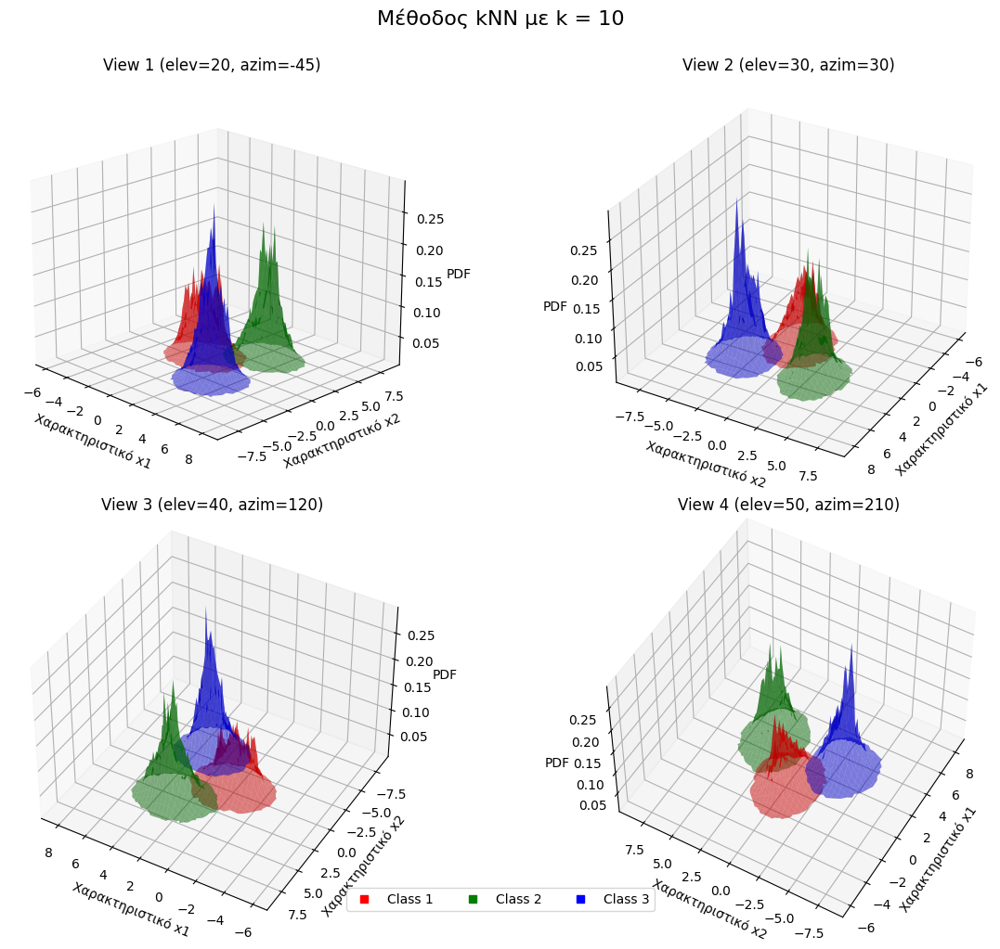

In [15]:
knn_classifier(10, classw1, classw2, classw3, True, 0.01)

**Επαναλάβετε το προηγούμενο βήμα για k = 3 και για k = 30. Τί παρατηρείτε;**

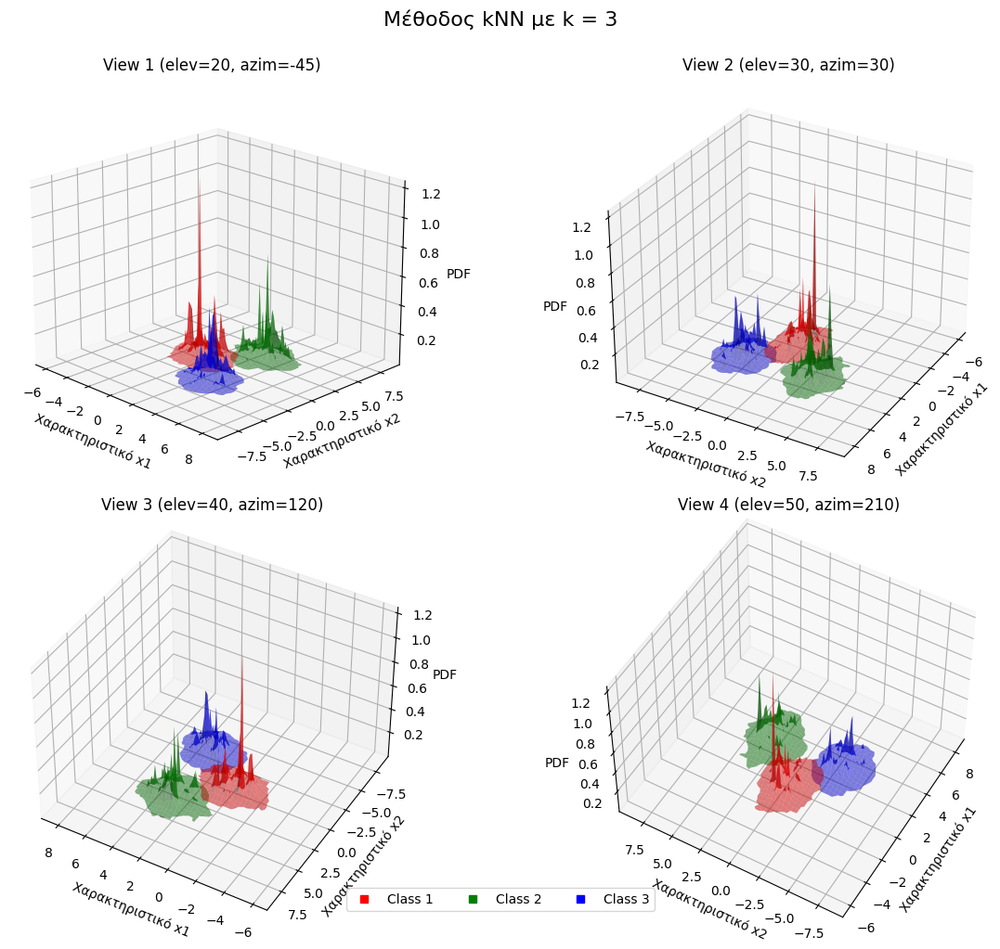

In [16]:
knn_classifier(3, classw1, classw2, classw3, True, 0.01)

Η μείωση της τιμής του k συνεπάγεται τον περιορισμό των κοντινότερων γειτόνων, με αποτέλεσμα να περιλαμβάνονται λιγότερα δεδομένα στον υπολογισμό της πυκνότητας πιθανότητας. Απόρροια αυτού είναι η αύξηση της ευαισθησίας του αλγορίθμου ως προς την τοπική δομή των δεδομένων (μείωση του bias), καθώς αυξάνεται η διακύμανση. Με άλλα λόγια η πρόβλεψη προσαρμόζεται καλύτερα στις τοπικές περιοχές.

Ωστόσο, η πολύ μικρή τιμή του k, υπερευαισθητοποιεί τον αλγόριθμο στα δεδομένα (τα οποία ενδέχεται να περιέχουν και θόρυβο), με αποτέλεσμα να οδηγούμαστε σε υπερβολική προσαρμογή (overfitting, δεν μπορεί να γενικεύσει). Επιπλέον, για την περίπτωση που τα δεδομένα μας εμπεριέχουν θόρυβο, η ταξινόμηση ενός σημείου ενδέχεται να καθοριστεί από ένα δείγμα outlier.

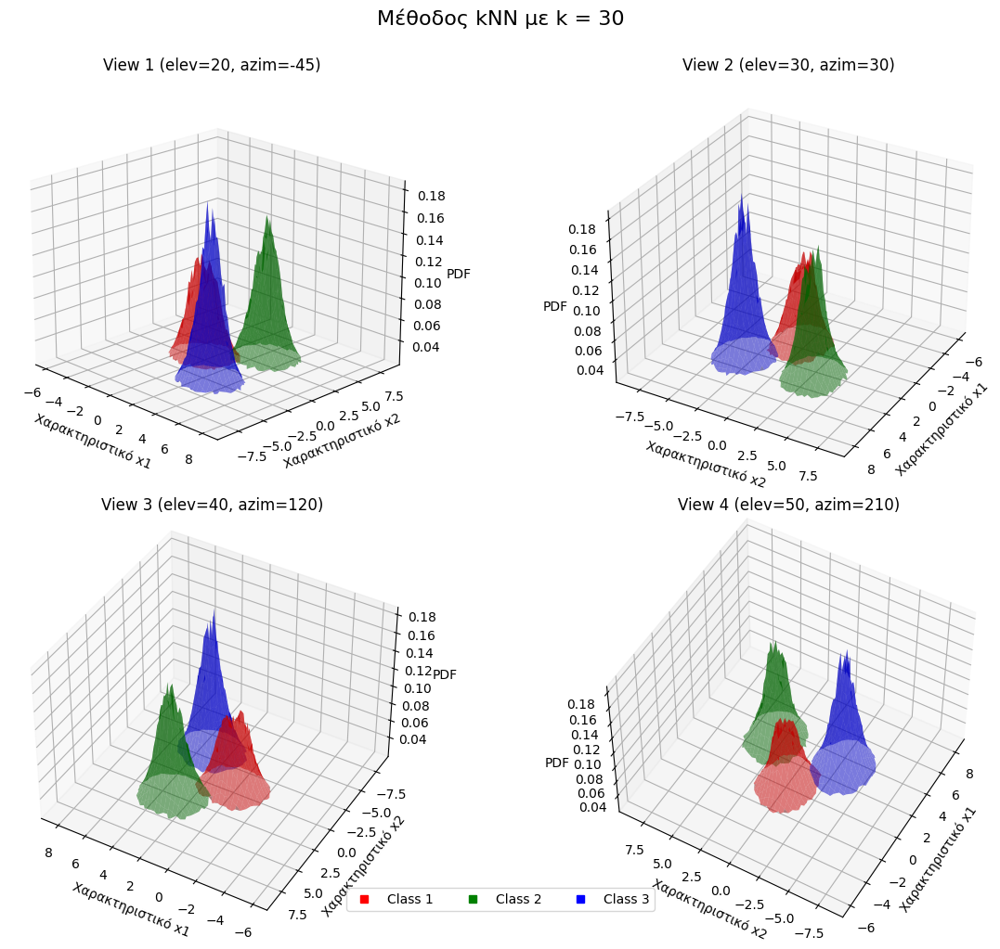

In [17]:
knn_classifier(30, classw1, classw2, classw3, True, 0.02)

Η αύξηση της τιμής του k συνεπάγεται την διεύρυνση των κοντινότερων γειτόνων, με αποτέλεσμα να περιλαμβάνονται περισσότερα δεδομένα στον υπολογισμό της πυκνότητας πιθανότητας. Απόρροια αυτού είναι η μείωση της ευαισθησίας του αλγορίθμου ως προς την τοπική δομή των δεδομένων (αύξηση του bias), καθώς μειώνεται η διακύμανση. Σε περίπτωση που τα δεδομένα έχουν θόρυβο, αυτός αγνοείται καθώς η απόφαση βασίζεται σε περισσότερα δείγματα. Με άλλα λόγια η πρόβλεψη προσεγγίζει μία πιο απλή δομή.

Ωστόσο, η πολύ μεγάλη τιμή του k, υπεργενικεύει τον αλγόριθμο, αφού χάνεται η ιδιότητα αναγνώρισης της πολυπλοκότητας των δεδομένων (αγνοείται η τοπική δομή). Έτσι, οδηγούμαστε σε underfitting (δεν μπορεί να εξειδικεύσει).

Κατά συνέπεια, η επιλογή κατάλληλης τιμή του k εξαρτάται από τη φύση των δεδομένων και καθορίζεται ύστερα από αρκετές δοκιμές. Στόχος είναι να βρεθεί μία τιμή k η οποία θα ισορροπεί μεταξύ underfitting και overfitting.

# **ΕΡΩΤΗΜΑ Γ**

**Θεωρώντας ότι όλες οι κλάσεις έχουν ίδιες apriori πιθανότητες, να απεικονίσετε τα δεδομένα και τις περιοχές απόφασης για ταξινόμηση σύμφωνα με τον κανόνα του Bayes και κατανομές που εκτιμώνται με τη μέθοδο των παραθύρων parzen για h = 0.1 , h = 0.3 , h = 1.5.**

**Πως επηρεάζονται οι περιοχές απόφασης από την παράμετρο παραθύρου; Σχολιάστε.**

1. Υπολογίζουμε την πυκνότητα πιθανότητας για κάθε κλάση χρησιμοποιώντας τη μέθοδο Parzen για τη συγκεκριμένη τιμή της παραμέτρου παραθύρου h=0.1.
2. Χρησιμοποιούμε αυτές τις πυκνότητες πιθανότητας για να υπολογίσουμε την περιοχή απόφασης για κάθε σημείο σε ένα πλέγμα στον χώρο των χαρακτηριστικών (x1, x2).
3. Απεικονίζουμε το αποτέλεσμα, δηλαδή τις κατανομές και τις περιοχές απόφασης.

In [18]:
from matplotlib.colors import ListedColormap

def Bayes_Parzen(h, classw1, classw2, classw3):
    # ΒΗΜΑ 1 - Υπολογισμός πυκνότητας πιθανότητας για κάθε κλάση
    X, Y, Z1, Z2, Z3 = parzen_classifier(h, classw1, classw2, classw3, False, 0)

    # ΒΗΜΑ 2 - Εύρεση περιοχών απόφασης για κάθε κλάση μέσω αντιστοίχισης των τυχαίων δειγμάτων στις κλάσεις
    # Προσδιορισμός κλάσης με την μεγαλύτερη πυκνότητα
    # Αναζητάται ανά γραμμή η μέγιστη τιμή στις κλάσεις και επιστρέφεται ο δείκτης της κλάσης αυτής
    estimated_labels = np.argmax(np.array([Z1, Z2, Z3]), axis=0) + 1  # Προσθέτουμε 1 γιατί οι κλάσεις ξεκινούν από 1 [Υ:0, Α:1]

    # ΒΗΜΑ 3 - Απεικόνιση
    plt.figure()
    plt.contourf(X, Y, estimated_labels, alpha=0.5, cmap=ListedColormap(['r', 'g', 'b']))

    plt.scatter(classw1[:, 0], classw1[:, 1], c='r', label='Class 1')
    plt.scatter(classw2[:, 0], classw2[:, 1], c='g', label='Class 2')
    plt.scatter(classw3[:, 0], classw3[:, 1], c='b', label='Class 3')

    plt.xlim(X.min(), X.max())
    plt.ylim(Y.min(), Y.max())
    plt.legend()
    plt.xlabel('Χαρακτηριστικό x1')
    plt.ylabel('Χαρακτηριστικό x2')
    plt.title('Περιοχές απόφασης Bayes με μέθοδο παραθύρων Parzen (h='+str(h)+')')
    plt.show()

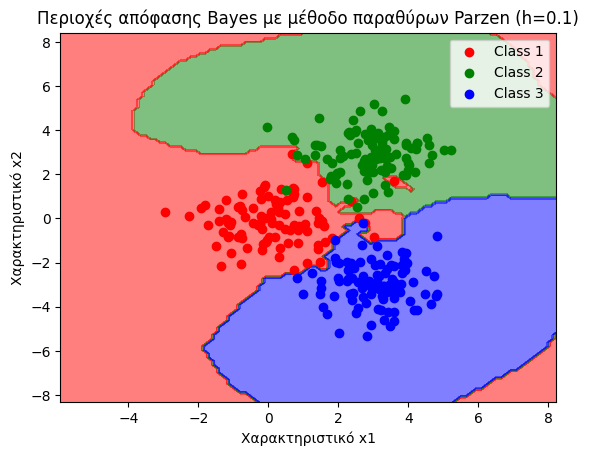

In [19]:
Bayes_Parzen(0.1, classw1, classw2, classw3)

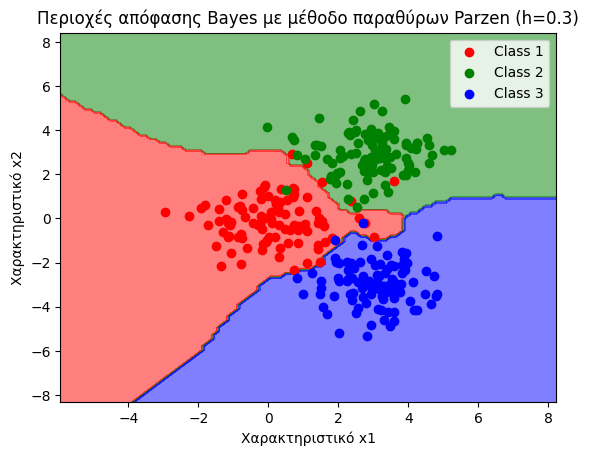

In [20]:
Bayes_Parzen(0.3, classw1, classw2, classw3)

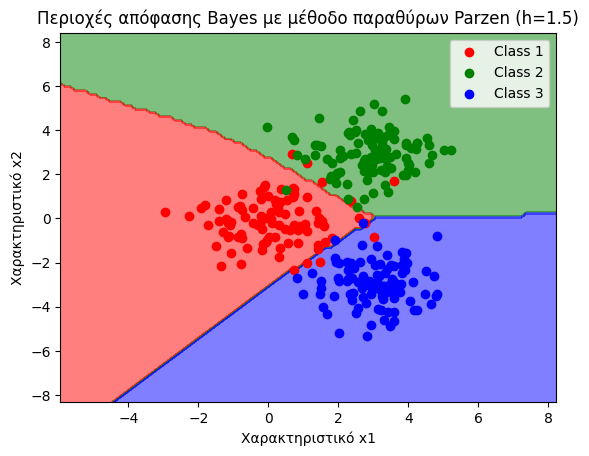

In [21]:
Bayes_Parzen(1.5, classw1, classw2, classw3)

Η παράμετρος παραθύρου \( h \), που χρησιμοποιείται στη μέθοδο Parzen window για την εκτίμηση της πυκνότητας πιθανότητας, έχει άμεση επίδραση στο πόσο ομαλοποιημένες ή "λεπτομερείς" θα είναι οι εκτιμώμενες κατανομές πυκνότητας και κατ' επέκταση στις περιοχές απόφασης.

1. **Μικρή τιμή του \( h \) (στενό παράθυρο):**

> Η εκτίμηση της σ.π.π. γίνεται πιο ευαίσθητη στα τοπικά χαρακτηριστικά, με αποτέλεσμα οι περιοχές απόφασης να γίνονται πολύ ακανόνιστες περικλείοντας μεμονωμένα στοιχεία ή μικρές ομάδες στοιχείων, αντικατοπτρίζοντας την υψηλή διακύμανση στην εκτίμηση της σ.π.π.


2. **Μεγάλη τιμή του \( h \) (ευρύ παράθυρο):**

>  Η εκτίμηση γίνεται ανθεκτική στις τοπικές διακυμάνσεις ομαλοποιώντας την εκτίμηση της σ.π.π. Οι περιοχές απόφασης γίνονται πιο ομαλές αφού παρουσιάζεται μικρότερη ευαισθησία στον θόρυβο ή σε outliers.

Τονίζεται πως για ακραίες τιμές του h εγκυμονεί ο κίνδυνος για over- ή underfitting αντίστοιχα. Συμπερασματικά, η επιλογή της κατάλληλης τιμής του \( h \) αποτελεί ένα trade off μεταξύ της ακρίβειας και της γενίκευσης.


# **ΕΡΩΤΗΜΑ Δ**

**Να απεικονίστε τα δεδομένα και τις περιοχές απόφασης για ταξινόμηση σύμφωνα με τον κανόνα k-NN για k=3**

Ακολουθώ την ίδια μεθοδολογία με το προηγούμενο ερώτημα, μόνο που αυτήν την φορά καλώ την συνάρτηση knn_classifier έναντι της parzen_classifier.

In [22]:
def Bayes_kNN(k, classw1, classw2, classw3):
    # ΒΗΜΑ 1 - Υπολογισμός πυκνότητας πιθανότητας για κάθε κλάση
    X, Y, k1, k2, k3 = knn_classifier(k, classw1, classw2, classw3, False, 0.01)

    # ΒΗΜΑ 2 - Εύρεση περιοχών απόφασης για κάθε κλάση μέσω αντιστοίχισης των τυχαίων δειγμάτων στις κλάσεις
    # Προσδιορισμός κλάσης με την μεγαλύτερη πυκνότητα
    # Αναζητάται ανά γραμμή η μέγιστη τιμή στις κλάσεις και επιστρέφεται ο δείκτης της κλάσης αυτής
    estimated_labels = np.argmax(np.array([k1, k2, k3]), axis=0) + 1  # Προσθέτουμε 1 για να ξεκινήσουν οι ετικέτες από 1 [Υ:0, Α:1]


    # ΒΗΜΑ 3 - ΑΠΕΙΚΟΝΙΣΗ
    plt.figure()
    plt.contourf(X, Y, estimated_labels, alpha=0.5, cmap=ListedColormap(['r', 'g', 'b']))

    plt.scatter(classw1[:, 0], classw1[:, 1], c='r', label='Class 1')
    plt.scatter(classw2[:, 0], classw2[:, 1], c='g', label='Class 2')
    plt.scatter(classw3[:, 0], classw3[:, 1], c='b', label='Class 3')

    plt.xlabel('Χαρακτηριστικό x1')
    plt.ylabel('Χαρακτηριστικό x2')
    plt.title('Περιοχές απόφασης Bayes με μέθοδο kNN (k='+str(k)+')')
    plt.legend()
    plt.show()

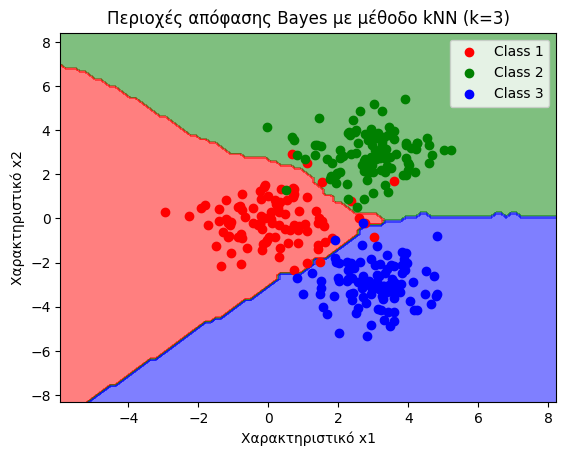

In [23]:
Bayes_kNN(3, classw1, classw2, classw3)

**Επαναλάβετε για k=8 και k=30. Πως επηρεάζονται οι περιοχές απόφασης από την παράμετρο k; Σχολιάστε.**

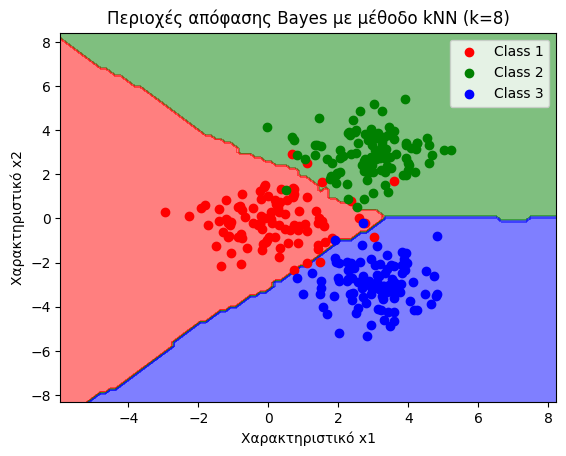

In [24]:
Bayes_kNN(8, classw1, classw2, classw3)

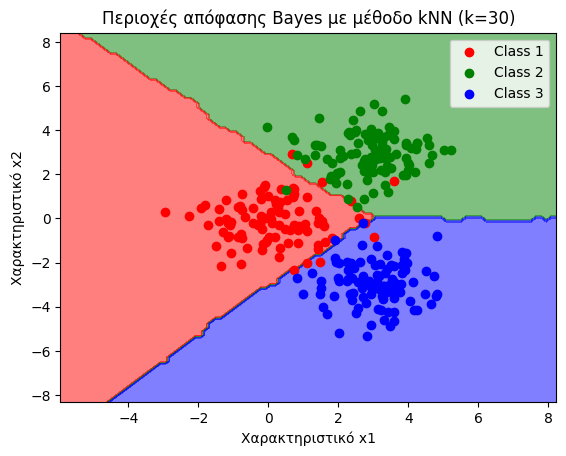

In [25]:
Bayes_kNN(30, classw1, classw2, classw3)

Η παράμετρος \( k \) παίζει κρίσιμο ρόλο στην εκτίμηση της σ.π.π. για τα δεδομένα. Επομένως, επηρεάζει άμεσα τις περιοχές απόφασης οι οποίες με την σειρά τους καθορίζουν το πώς ταξινομούνται τα στοιχεία του test set.

1. **Μικρές τιμές του \( k \):**
> Η εκτίμηση της σ.π.π. γίνεται πιο ευαίσθητη στα τοπικά χαρακτηριστικά, με αποτέλεσμα οι περιοχές απόφασης να γίνονται ακανόνιστες, αντικατοπτρίζοντας την υψηλή διακύμανση στην εκτίμηση της σ.π.π.

2. **Μεγάλες τιμές του \( k \):**

> Η εκτίμηση γίνεται ανθεκτική στις τοπικές διακυμάνσεις ομαλοποιώντας την εκτίμηση της σ.π.π. Οι περιοχές απόφασης γίνονται πιο ομαλές αφού παρουσιάζεται μικρότερη ευαισθησία στον θόρυβο ή σε outliers.

Τονίζεται πως για ακραίες τιμές του k εγκυμονεί ο κίνδυνος για over- ή underfitting αντίστοιχα. Συμπερασματικά, η επιλογή της κατάλληλης τιμής του k αποτελεί ένα trade off μεταξύ της ακρίβειας και της γενίκευσης.